<a href="https://colab.research.google.com/github/Natansh20/DogVision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we're using is from Kaggle

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images so it's probably best we use Deep learning/transfer learning
* There are 120 breeds of dogs.
* There are 10,000+ images in both train and test set.

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# !unzip "/content/drive/MyDrive/Dog_Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog_Vision/"

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Use a GPU ✅

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:  2.13.0
TF Hub version:  0.14.0
GPU available (YESSSS!!!)


## Getting our data ready (turning into Tensors)


Lets start by accessing our data and checking out our labels

In [ ]:
# Checkout the labels
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog_Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

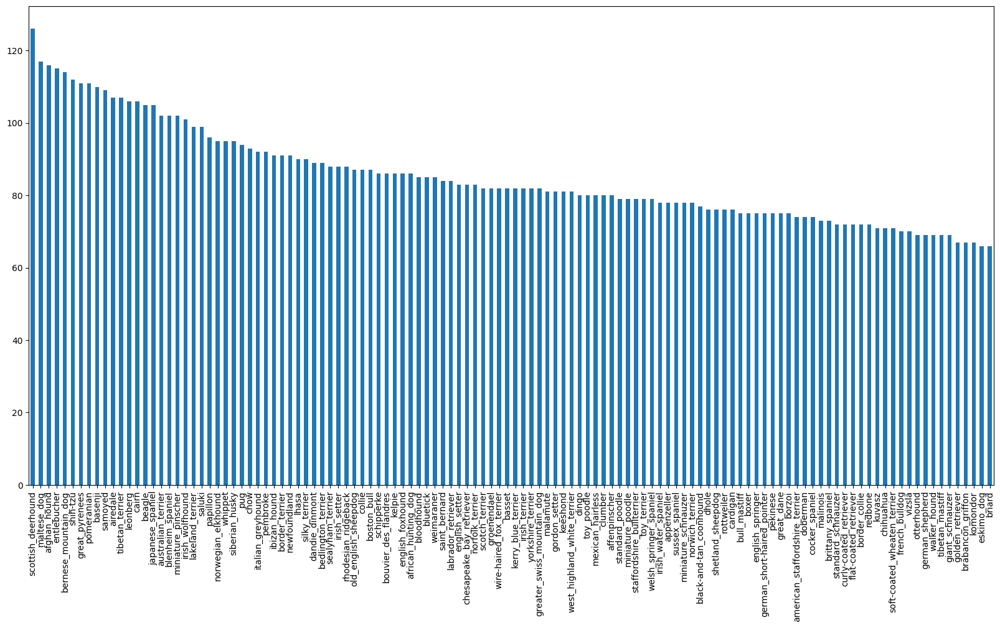

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

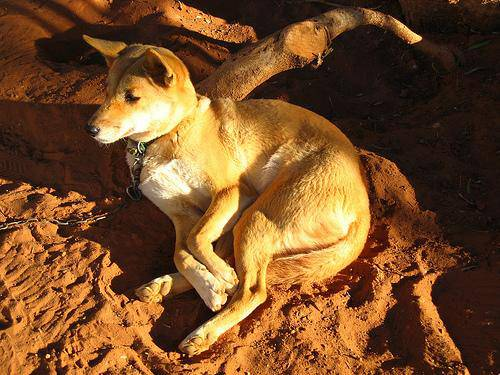

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames

In [ ]:
# Create pathnames from image IDs
filenames = ["drive/MyDrive/Dog_Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
filenames

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog_Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog_Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog_Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog_Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog_Vision/train"))== len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files


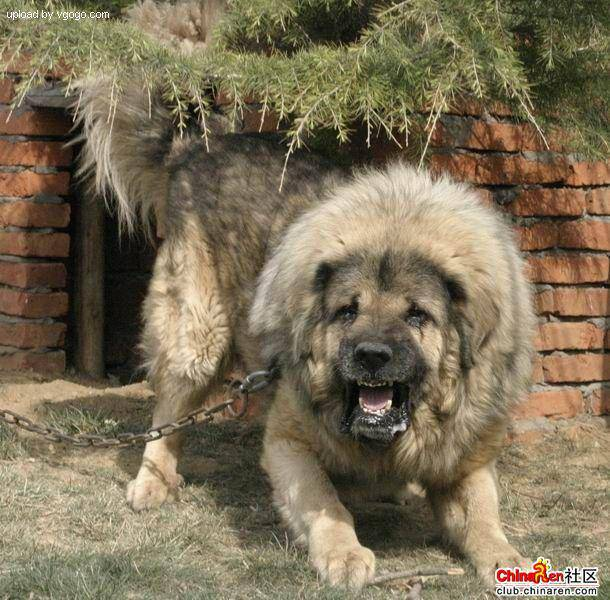

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image file paths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number labels matches number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data Directories")

Number of labels matches number of filenames!


In [ ]:
# Find the unique labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels ]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating your own validation set

Since the dataset from kaggle doesn't come with a validation set, we're gonna create our own

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [ ]:
# Spliting our data into train and validation set
from sklearn.model_selection import train_test_split

# Split them into train and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog_Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog_Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog_Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

##Preprocessing Images (turning images into Tensor)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take and image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn out `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224).
6. Return the modified `image`

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Make a function to preprocess images
IMG_SIZE = 224


def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes the image file path and turns the image into a Tensor.
  """

  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if needed)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  process the image and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize = (12,12))
  # Loop through 25
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grids off
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

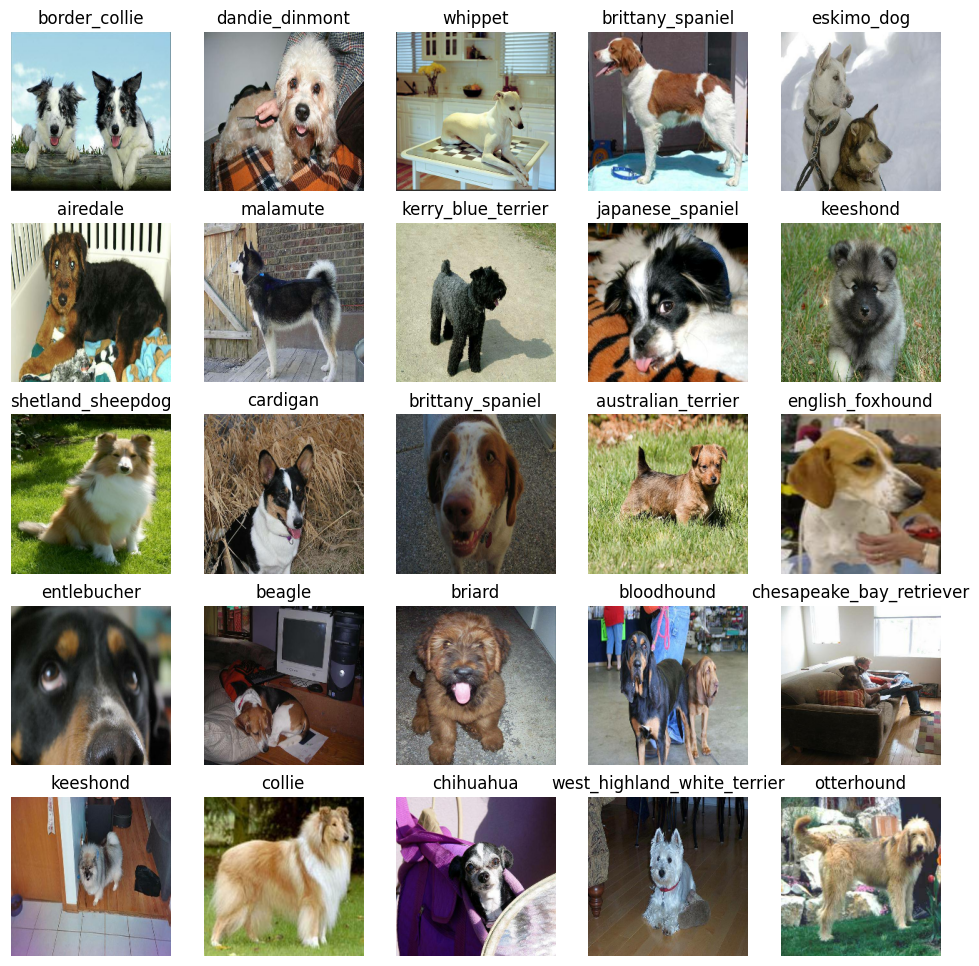

In [ ]:
# Now let's visualize the data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

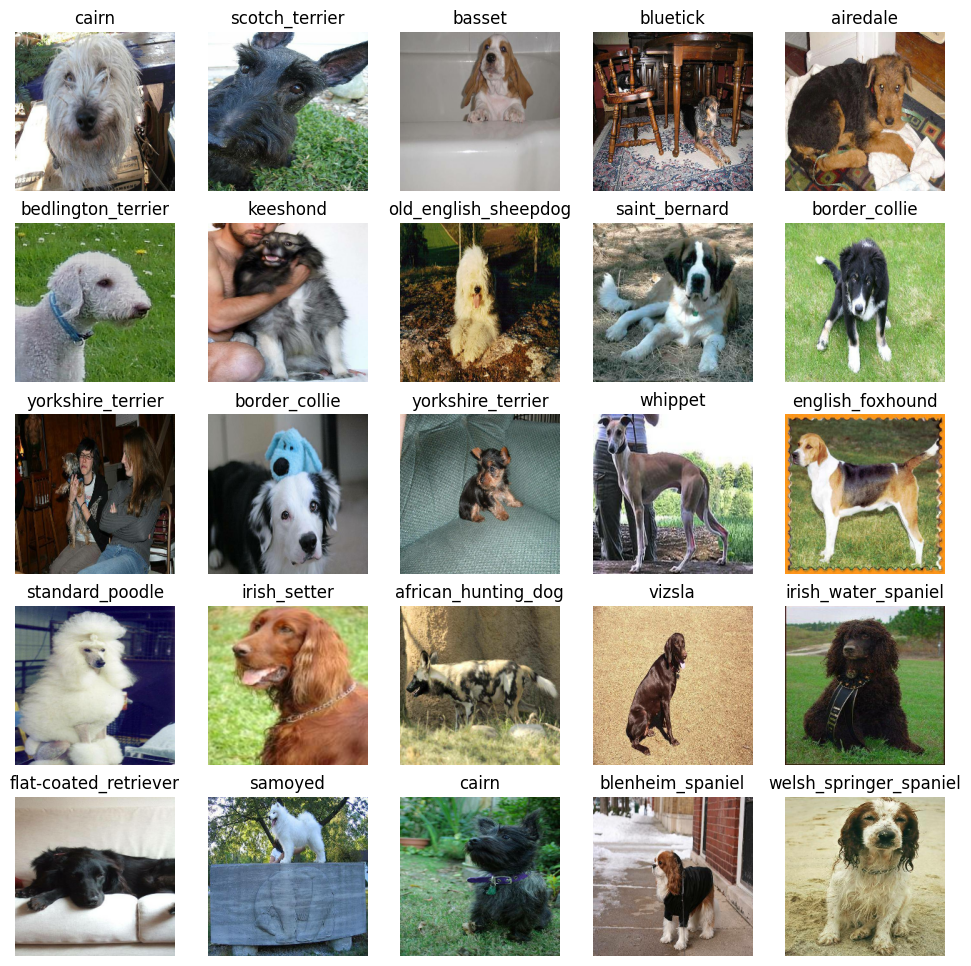

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our images' shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, widht, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

### Compile()
In summary, the `compile()` function sets up the necessary components for the model's training process: the loss function, optimizer, and evaluation metrics.

**Loss Function (`loss`):** The loss function is a mathematical function that measures the difference between the predicted values and the actual target values. It quantifies how well or poorly the model is performing.

**Optimizer (`optimizer`):** The optimizer is responsible for updating the model's parameters (weights) based on the calculated gradients of the loss function. The choice of optimizer influences how quickly the model converges to a solution.

**Metrics (`metrics`):** Metrics are used to evaluate the performance of the model during training. They provide additional information beyond the loss value.
They help monitor the model's progress during training and can indicate potential issues like overfitting.



In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])

   # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if the model stops improving.

We'll create 2 callbacks, on for Tensorboard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook ext
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog_Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience = 3)

## Training our model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max: 100, step:10}

In [ ]:
print("GPU", "available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 182s 7s/step - loss: 4.5838 - accuracy: 0.0875 - val_loss: 3.4790 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 148ms/step - loss: 1.6427 - accuracy: 0.6787 - val_loss: 2.2090 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 4s 167ms/step - loss: 0.5586 - accuracy: 0.9350 - val_loss: 1.7775 - val_accuracy: 0.5450
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2516 - accuracy: 0.9875 - val_loss: 1.5349 - val_accuracy: 0.5750
Epoch 5/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1460 - accuracy: 0.9962 - val_loss: 1.4556 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 3s 129ms/step - loss: 0.1008 - accuracy: 1.0000 - val_loss: 1.4206 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================

#### **Question:**
It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!

#### **Answer:**
1. **Early Stopping**
2. **Data Augmentation**
3. **Regularization:** Penalize the model during training based on the magnitude of the weights.
Regularization is a technique to reduce the complexity of the model. It does so by adding a penalty term to the loss function.

4. **Dropouts:** It randomly drops neurons from the neural network during training in each iteration. When we drop different sets of neurons, it’s equivalent to training different neural networks. The different networks will overfit in different ways, so the net effect of dropout will be to reduce overfitting.
5. **Simplifying the Model**

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_Vision/logs/

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 49s 102ms/step


array([[2.3083754e-03, 4.1734475e-05, 3.5527401e-04, ..., 2.7263261e-04,
        7.3828429e-05, 5.3900057e-03],
       [1.2024336e-03, 2.4873447e-03, 2.2187238e-03, ..., 2.2054703e-03,
        2.0771387e-03, 5.2733772e-04],
       [5.1445154e-06, 7.9382306e-05, 3.7386748e-05, ..., 1.2910117e-05,
        5.1344919e-06, 2.2862974e-05],
       ...,
       [1.1494135e-04, 8.5231542e-05, 8.6150249e-05, ..., 1.0089284e-05,
        5.5750582e-04, 5.7478537e-05],
       [2.9947665e-03, 1.0823433e-03, 2.2182640e-04, ..., 1.2104400e-03,
        8.4172032e-05, 8.1288507e-03],
       [6.5017468e-03, 4.0558847e-05, 3.5851542e-04, ..., 1.1435556e-02,
        1.9755617e-03, 1.5532515e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum:  {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.30837543e-03 4.17344745e-05 3.55274009e-04 4.81546944e-04
 9.46248358e-04 3.99088131e-05 1.60389226e-02 1.91694638e-03
 4.54520050e-04 3.76459066e-04 2.73557962e-04 1.01562604e-04
 2.88995128e-04 5.25013136e-04 1.16220886e-04 2.40297275e-04
 2.02156341e-04 3.34963322e-01 3.77201359e-05 2.16568238e-04
 1.59772113e-03 3.17693426e-04 7.28835221e-05 1.01825048e-03
 7.91374041e-05 1.58584316e-03 1.85051993e-01 1.23620368e-04
 1.41327945e-03 5.40539448e-04 1.31252280e-04 2.21452024e-03
 4.77964728e-04 1.23973135e-04 3.78210883e-04 2.92772334e-02
 1.39061696e-04 1.66579717e-04 8.41006113e-05 6.19897328e-05
 5.28737716e-03 1.77710972e-05 3.04260666e-05 2.31279439e-04
 6.42671221e-05 2.31921760e-04 1.45418671e-04 4.14084672e-04
 4.28343104e-04 4.33831447e-04 3.24552151e-04 1.53327623e-04
 3.84103245e-04 1.19545090e-04 5.93184523e-05 3.87577893e-05
 9.42283892e-04 7.53880106e-03 3.04100424e-04 5.36608100e-02
 4.73940687e-04 5.95166921e-06 4.14424483e-03 5.26760232e-05
 2.02797528e-04 1.741116

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of image and labels.
  """
  images = []
  labels = []
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

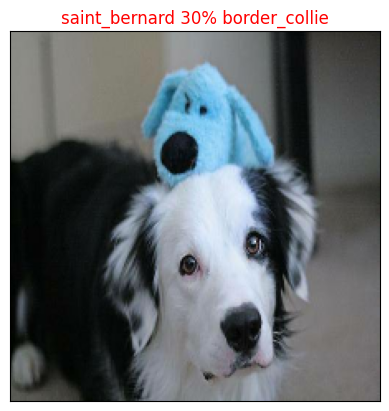

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n=11)

Now we've got one function to view our model's top prediction, let's make another to view top 10 predictions

The function will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediciton using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability balues and labels green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediciton confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

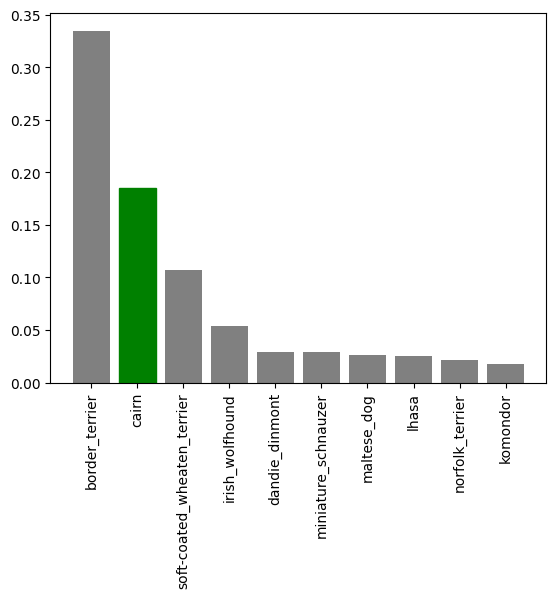

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 0)

In [ ]:
# predictions[0].argsort() # gives us order of indexes that will sort the predictions[0] array.
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.33496332, 0.18505199, 0.10731944, 0.05366081, 0.02927723,
       0.02878547, 0.02645126, 0.02513786, 0.02159269, 0.01741117],
      dtype=float32)

Now we've got some function to visualize our predictions and evaluate our model, let's check out a few.

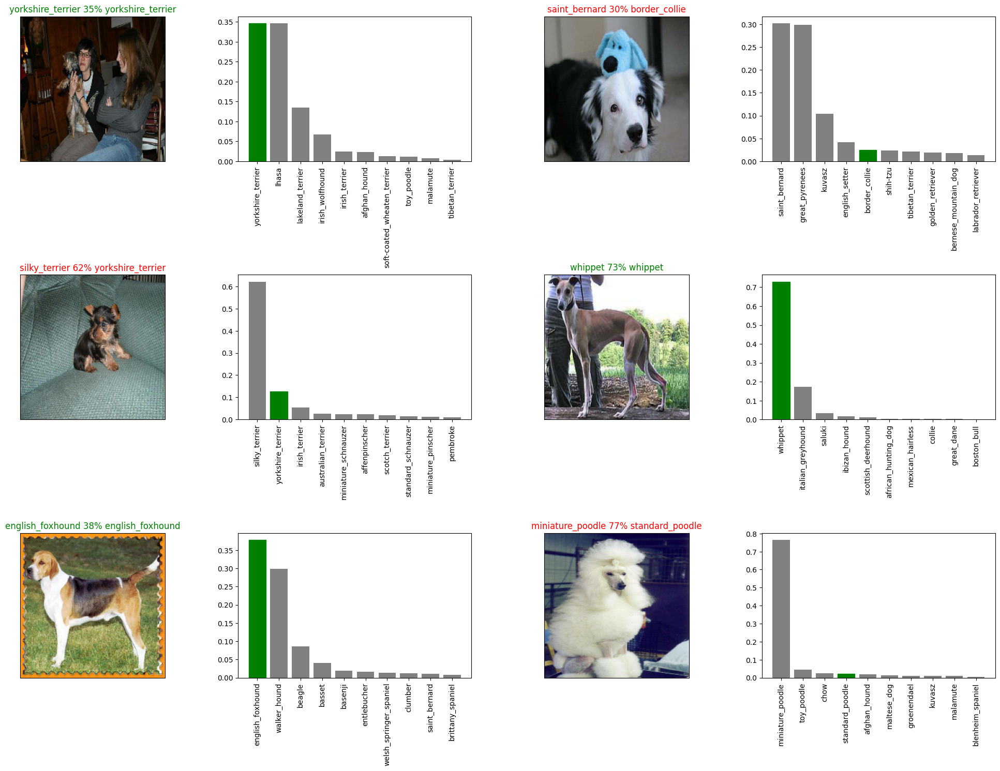

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10 # shows images starting from ith number
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our model's prediction and true labels?

In [ ]:
predictions

array([[2.3083754e-03, 4.1734475e-05, 3.5527401e-04, ..., 2.7263261e-04,
        7.3828429e-05, 5.3900057e-03],
       [1.2024336e-03, 2.4873447e-03, 2.2187238e-03, ..., 2.2054703e-03,
        2.0771387e-03, 5.2733772e-04],
       [5.1445154e-06, 7.9382306e-05, 3.7386748e-05, ..., 1.2910117e-05,
        5.1344919e-06, 2.2862974e-05],
       ...,
       [1.1494135e-04, 8.5231542e-05, 8.6150249e-05, ..., 1.0089284e-05,
        5.5750582e-04, 5.7478537e-05],
       [2.9947665e-03, 1.0823433e-03, 2.2182640e-04, ..., 1.2104400e-03,
        8.4172032e-05, 8.1288507e-03],
       [6.5017468e-03, 4.0558847e-05, 3.5851542e-04, ..., 1.1435556e-02,
        1.9755617e-03, 1.5532515e-04]], dtype=float32)

In [ ]:
val_labels

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie',
 'yorkshire_terrier',
 'border_collie',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'standard_poodle',
 'irish_setter',
 'african_hunting_dog',
 'vizsla',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'norwich_terrier',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'mexican_hairless',
 'eskimo_dog',
 'siberian_husky',
 'welsh_springer_spaniel',
 'doberman',
 'mexican_hairless',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'english_foxhound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'standard_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'vizsla',
 'norfolk_terrier',
 'pug',
 'bedlington_terrier',
 'affenpinsche

In [ ]:
def prob_2_labels(predictions):
  pred_label_cm = []
  for i in range(len(predictions)):
      prob_labels = unique_breeds[np.argmax(predictions[i])]
      pred_label_cm.append(prob_labels)
  return pred_label_cm

In [ ]:
pred_label_cm = prob_2_labels(predictions)
pred_label_cm

['border_terrier',
 'scotch_terrier',
 'basset',
 'lakeland_terrier',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'collie',
 'yorkshire_terrier',
 'saint_bernard',
 'silky_terrier',
 'whippet',
 'english_foxhound',
 'miniature_poodle',
 'irish_setter',
 'african_hunting_dog',
 'labrador_retriever',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'cairn',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'cairn',
 'malamute',
 'malamute',
 'welsh_springer_spaniel',
 'doberman',
 'german_short-haired_pointer',
 'labrador_retriever',
 'labrador_retriever',
 'lakeland_terrier',
 'walker_hound',
 'border_collie',
 'miniature_poodle',
 'groenendael',
 'boston_bull',
 'miniature_poodle',
 'miniature_poodle',
 'papillon',
 'american_staffordshire_terrier',
 'chesapeake_bay_retriever',
 'norfolk_terrier',
 'pug',

In [ ]:
from sklearn.metrics import confusion_matrix
figsize = (10,10)
# creating a confusion matrix
confusion_matrix(val_labels, pred_label_cm)

# Normalizing our confusion matrix probabilities
# cm_norm = cm.astype("float")/cm.sum(axis=1)[:,np.newaxis]
# n_classes = cm.shape[0]

array([[2, 0, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 2]])

In [ ]:
from sklearn.metrics import multilabel_confusion_matrix
mcm = multilabel_confusion_matrix(val_labels, pred_label_cm)

In [ ]:
mcm.shape

(110, 2, 2)

In [ ]:
# import seaborn as sns
# combined_matrix = sum(mcm)

# plt.figure(figsize=(5,5))
# sns.set(font_scale=1.2)
# sns.heatmap(combined_matrix, annot = True, fmt="d", cmap="Blues", linewidths=0.5, cbar=False,
#             xticklabels=["1", "0"], yticklabels=["1", "0"])
# plt.xlabel("Actual")
# plt.ylabel("Predicted")
# plt.title("Combined Confusion Matrix")

# plt.show()

## DEFINITELY WRONG

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog_Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

## Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_Vision/models/20230920-07541695196447-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_Vision/models/20230920-07541695196447-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_images_model = load_model("drive/MyDrive/Dog_Vision/models/20230913-17431694627016-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog_Vision/models/20230913-17431694627016-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 93ms/step - loss: 1.3449 - accuracy: 0.6250


[1.344923496246338, 0.625]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.2285 - accuracy: 0.7050


[1.2285126447677612, 0.7049999833106995]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# # Fit the full model to the full data
# full_model.fit(x = full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard, full_model_early_stopping])

In [ ]:
# save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog_Vision/models/20230919-17131695143603-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog_Vision/models/20230919-17131695143603-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created 'create_data_batches()`earlier which can take a list of filenames as inputs and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the  `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog_Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_Vision/test/dd7bf84df93991b7c15ec739c82acc04.jpg',
 'drive/MyDrive/Dog_Vision/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 'drive/MyDrive/Dog_Vision/test/dcb6ce994241db517c1ebe42897db826.jpg',
 'drive/MyDrive/Dog_Vision/test/de327414ced20d4e6f786a68bff82e10.jpg',
 'drive/MyDrive/Dog_Vision/test/dfe25675d32a75ade0f2893cf2ab63a9.jpg',
 'drive/MyDrive/Dog_Vision/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 'drive/MyDrive/Dog_Vision/test/e55fa0c818f485f8e36edfb464c4f129.jpg',
 'drive/MyDrive/Dog_Vision/test/de291f05facd9c7db8d4880a0c84263b.jpg',
 'drive/MyDrive/Dog_Vision/test/e752d87634c6177a748d655a55aeec89.jpg',
 'drive/MyDrive/Dog_Vision/test/dfc9bcbafc1e249cd07a25c8f50384e0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling the `predict()` on our full model and passing it the test data batch will take a long time to run.

In [ ]:
# Make predictions on our test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 2601s 8s/step


In [ ]:
# Save predictions (Numpy array) to csv file (to access later)
np.savetxt("drive/MyDrive/Dog_Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog_Vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions[:10]

array([[9.99959946e-01, 1.01178397e-11, 4.06319894e-10, ...,
        2.90218006e-11, 3.74854059e-09, 1.31448488e-08],
       [1.62781788e-07, 5.65109737e-10, 1.27102780e-07, ...,
        1.22486483e-06, 9.05286113e-04, 6.03061437e-07],
       [2.61331932e-03, 8.80663429e-05, 8.20495654e-04, ...,
        8.35152150e-07, 1.78587847e-08, 1.35754705e-08],
       ...,
       [2.25673466e-10, 1.49738995e-08, 6.57383259e-09, ...,
        1.81039650e-06, 4.10366255e-11, 1.77179265e-06],
       [2.18355822e-09, 2.09068665e-10, 1.64268564e-11, ...,
        5.69059730e-12, 1.71053072e-09, 6.14723135e-08],
       [8.28768236e-07, 1.12095166e-09, 1.00437250e-08, ...,
        3.35854483e-10, 1.11026154e-07, 2.01198086e-02]])

In [ ]:
test_predictions.shape

(10357, 120)

# Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model predictions probability outputs in a DataFrame with an ID and column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation/

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7bf84df93991b7c15ec739c82acc04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df47feaaf3dfb33cf712cccdddc8060e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcb6ce994241db517c1ebe42897db826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,de327414ced20d4e6f786a68bff82e10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dfe25675d32a75ade0f2893cf2ab63a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0829a60da0c03d84426d455ee8a8de24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,08c1a66912af795920a43e563acfe5aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07f7c5497dd9bd91f62b7d292973393b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,07cbc12094a8f4a54700054222a25da3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7bf84df93991b7c15ec739c82acc04,9.999599e-01,1.011784e-11,4.063199e-10,7.394055e-13,9.598228e-13,1.677235e-12,7.858322e-11,3.336597e-13,9.999314e-12,...,3.661529e-10,2.478109e-11,1.557989e-11,2.446937e-10,1.338842e-11,5.489378e-13,1.089514e-11,2.902180e-11,3.748541e-09,1.314485e-08
1,df47feaaf3dfb33cf712cccdddc8060e,1.627818e-07,5.651097e-10,1.271028e-07,1.645476e-10,7.400132e-09,1.016762e-12,4.541939e-07,2.235714e-06,5.975039e-09,...,9.640493e-10,7.836724e-06,5.253573e-11,7.361236e-09,1.407599e-09,2.613865e-08,3.011610e-05,1.224865e-06,9.052861e-04,6.030614e-07
2,dcb6ce994241db517c1ebe42897db826,2.613319e-03,8.806634e-05,8.204957e-04,9.103929e-06,3.042328e-05,4.412151e-05,4.444441e-05,1.434265e-09,2.243885e-08,...,9.698160e-05,1.191361e-08,3.016337e-06,5.875410e-06,1.076555e-05,1.102134e-12,3.528586e-07,8.351522e-07,1.785878e-08,1.357547e-08
3,de327414ced20d4e6f786a68bff82e10,7.586053e-08,8.002243e-10,1.130156e-09,2.962796e-08,8.785025e-04,6.562786e-09,8.735692e-08,4.530327e-06,2.456511e-08,...,4.322083e-07,7.567263e-05,3.232659e-08,6.654004e-07,6.555990e-10,9.844772e-09,1.449847e-05,1.626324e-07,1.298462e-04,2.297178e-07
4,dfe25675d32a75ade0f2893cf2ab63a9,3.532851e-10,5.442367e-08,1.601864e-09,1.624804e-09,1.097516e-09,3.617007e-11,1.092133e-09,1.744106e-08,1.378918e-06,...,1.476453e-09,4.799494e-11,1.560018e-10,1.105712e-10,2.891961e-10,1.166621e-09,4.037662e-09,2.197070e-08,4.166244e-07,2.018918e-09


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog_Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog_Vision/Dog_photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog_Vision/Dog_photos/dog-photo-2.jpg',
 'drive/MyDrive/Dog_Vision/Dog_photos/dog-photo-1.jpg',
 'drive/MyDrive/Dog_Vision/Dog_photos/dog-photo-3.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['beagle', 'golden_retriever', 'great_dane']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

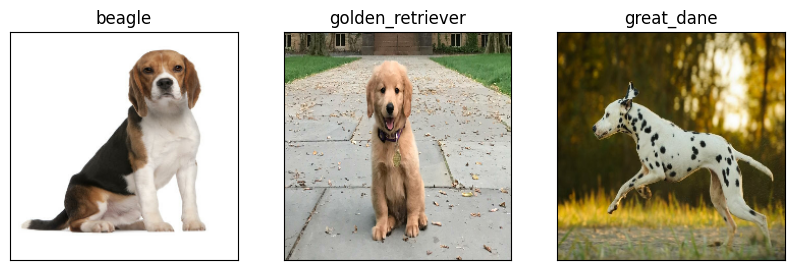

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)